Esercizio

SLAM

L'implementazione dell'algoritmo FastSLAM si basa sul filtro particellare e appartiene alla famiglia degli approcci probabilistici SLAM. È utilizzato con mappe basate su feature (landmark) o con mappe della griglia di occupazione.

In particolare, il filtro particellare rappresenta la stima della posizione del robot attraverso un insieme di particelle. Ogni singola particella ha una credenza indipendente, in quanto mantiene la posizione e una serie di landmark per n landmark (x,y,θ).

Le particelle sono inizialmente tratte da una distribuzione uniforme e rappresentano l'incertezza iniziale. I passi sono i seguenti:

PREDIZIONE

CORREZIONE

RICAMPIONAMENTO

Per poter implementare l'algoritmo importiamo le seguenti librerie e dichiariamo i seguenti parametri:

In [17]:
import math

import matplotlib.pyplot as plt
import numpy as np
from copy import deepcopy

# Fast SLAM covariance
Q = np.diag([3.0, np.deg2rad(10.0)]) ** 2
R = np.diag([1.0, np.deg2rad(20.0)]) ** 2

#  Simulation parameter
Q_sim = np.diag([0.3, np.deg2rad(2.0)]) ** 2
R_sim = np.diag([0.5, np.deg2rad(10.0)]) ** 2
OFFSET_YAW_RATE_NOISE = 0.01

DT = 0.1  # tempo [s]
SIM_TIME = 50.0  # simulazione tempo [s]
MAX_RANGE = 20.0  # massimo range di osservazione
M_DIST_TH = 2.0  # Soglia della distanza di Mahalanobis per l'associazione dei dati.
STATE_SIZE = 3  # Dimensione dello stato [x,y,yaw]
LM_SIZE = 2  # Dimensione della velocità LM [x,y]
N_PARTICLE = 100  # numero di particelle
NTH = N_PARTICLE / 1.5  # numero di particelle per il ricampionamento

show_animation = True



Implementiamo la classe per identificare le particelle e ne definiamo le proprietà

In [18]:
class Particle:

    def __init__(self, n_landmark):
        self.w = 1.0 / N_PARTICLE
        self.x = 0.0
        self.y = 0.0
        self.yaw = 0.0
        # landmark x-y positions
        self.lm = np.zeros((n_landmark, LM_SIZE))
        # landmark position covariance
        self.lmP = np.zeros((n_landmark * LM_SIZE, LM_SIZE))

FASE DI PREZIONE:

fase in cui si stima una credenza per ogni particella avendo come parametro di misura solo il modello del moto. 

Per la fase di predizione implementiamo i seguenti metodi:

- predict_particles = è il metodo che stima la posizione per ogni particella basandosi sul modello del moto.
- motion_ model = è il metodo che definisce il modello del moto.
- pi_2_pi = è un metodo utile alla definizione del modello del moto.

In [19]:
def pi_2_pi(angle):
    return (angle + math.pi) % (2 * math.pi) - math.pi

def motion_model(x, u):
    F = np.array([[1.0, 0, 0],
                  [0, 1.0, 0],
                  [0, 0, 1.0]])

    B = np.array([[DT * math.cos(x[2, 0]), 0],
                  [DT * math.sin(x[2, 0]), 0],
                  [0.0, DT]])

    x = F @ x + B @ u

    x[2, 0] = pi_2_pi(x[2, 0])

    return x

def predict_particles(particles, u):
    for i in range(N_PARTICLE):
        px = np.zeros((STATE_SIZE, 1))
        px[0, 0] = particles[i].x
        px[1, 0] = particles[i].y
        px[2, 0] = particles[i].yaw
        ud = u + (np.random.randn(1, 2) @ R ** 0.5).T  # add noise
        px = motion_model(px, ud)
        particles[i].x = px[0, 0]
        particles[i].y = px[1, 0]
        particles[i].yaw = px[2, 0]

    return particles



Possiamo vedere come la distribuzione di particelle si evolve nel caso in cui forniamo solo il movimento senza osservazione.
L'incertezza aumenta e le particelle divergono
(se includiamo le osservazioni l'incertezza diminuisce e le particelle convergono alla stima corretta).

In [25]:
from ipywidgets import *
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

N_LM = 0
particles = [Particle(N_LM) for i in range(N_PARTICLE)]
time= 0.0
v = 1.0  # [m/s]
yawrate = 0.1  # [rad/s]
u = np.array([v, yawrate]).reshape(2, 1)
history = []
while SIM_TIME >= time:
    time += DT
    particles = predict_particles(particles, u)
    history.append(deepcopy(particles))
    
# riproduzione del movimento registrato dalle particelle 
def plot_particles(t=0):
    x = []
    y = []
    for i in range(len(history[t])):
        x.append(history[t][i].x)
        y.append(history[t][i].y)
    plt.figtext(0.15,0.82,'t = ' + str(t))
    plt.plot(x, y, '.r')
    plt.axis([-20,20, -5,25])

interact(plot_particles, t=(0,len(history)-1,1))

interactive(children=(IntSlider(value=0, description='t', max=499), Output()), _dom_classes=('widget-interact'…

<function __main__.plot_particles(t=0)>

FASE DI CORREZIONE:

fase in cui si aggiornano le credenze di ogni particella avendo come parametri, oltre al modello del moto, anche le misurazioni sensoriali.

Per la fase di correzione definiamo i seguenti metodi:
- update_with_observation = è il metodo che si occupa di aggiornare le particelle con osservazioni, dove i pesi sono regolati in base alla probabilità che la particella abbia la corretta posizione data la misurazione del sensore.

- add_new_landmark = è il metodo che si occupa di aggiungere un nuovo landmark sulla base dell'oservazione fatta.

- compute_weight= è il metodo che si occupa di calcolare il peso delle particelle dopo l'osservazione.

- compute_jacobians= è il metodo che si occupa di calcolare la matrice jacobiana utile al calcolo del peso.

- update_landmark= è il metodo che si occupa di aggiornare i landmark dopo ogni osservazione.

- update_kf_with_cholesky= è il metodo utile all'aggiornamento dei landmark.

In [21]:
def update_kf_with_cholesky(xf, Pf, v, Q_cov, Hf):
    PHt = Pf @ Hf.T
    S = Hf @ PHt + Q_cov

    S = (S + S.T) * 0.5
    s_chol = np.linalg.cholesky(S).T
    s_chol_inv = np.linalg.inv(s_chol)
    W1 = PHt @ s_chol_inv
    W = W1 @ s_chol_inv.T

    x = xf + W @ v
    P = Pf - W1 @ W1.T

    return x, P

def update_landmark(particle, z, Q_cov):
    lm_id = int(z[2])
    xf = np.array(particle.lm[lm_id, :]).reshape(2, 1)
    Pf = np.array(particle.lmP[2 * lm_id:2 * lm_id + 2, :])

    zp, Hv, Hf, Sf = compute_jacobians(particle, xf, Pf, Q)

    dz = z[0:2].reshape(2, 1) - zp
    dz[1, 0] = pi_2_pi(dz[1, 0])

    xf, Pf = update_kf_with_cholesky(xf, Pf, dz, Q_cov, Hf)

    particle.lm[lm_id, :] = xf.T
    particle.lmP[2 * lm_id:2 * lm_id + 2, :] = Pf

    return particle

def compute_jacobians(particle, xf, Pf, Q_cov):
    dx = xf[0, 0] - particle.x
    dy = xf[1, 0] - particle.y
    d2 = dx ** 2 + dy ** 2
    d = math.sqrt(d2)

    zp = np.array(
        [d, pi_2_pi(math.atan2(dy, dx) - particle.yaw)]).reshape(2, 1)

    Hv = np.array([[-dx / d, -dy / d, 0.0],
                   [dy / d2, -dx / d2, -1.0]])

    Hf = np.array([[dx / d, dy / d],
                   [-dy / d2, dx / d2]])

    Sf = Hf @ Pf @ Hf.T + Q_cov

    return zp, Hv, Hf, Sf

def compute_weight(particle, z, Q_cov):
    lm_id = int(z[2])
    xf = np.array(particle.lm[lm_id, :]).reshape(2, 1)
    Pf = np.array(particle.lmP[2 * lm_id:2 * lm_id + 2])
    zp, Hv, Hf, Sf = compute_jacobians(particle, xf, Pf, Q_cov)

    dx = z[0:2].reshape(2, 1) - zp
    dx[1, 0] = pi_2_pi(dx[1, 0])

    try:
        invS = np.linalg.inv(Sf)
    except np.linalg.linalg.LinAlgError:
        print("singular")
        return 1.0

    num = math.exp(-0.5 * dx.T @ invS @ dx)
    den = 2.0 * math.pi * math.sqrt(np.linalg.det(Sf))

    w = num / den

    return w

def add_new_landmark(particle, z, Q_cov):
    r = z[0]
    b = z[1]
    lm_id = int(z[2])

    s = math.sin(pi_2_pi(particle.yaw + b))
    c = math.cos(pi_2_pi(particle.yaw + b))

    particle.lm[lm_id, 0] = particle.x + r * c
    particle.lm[lm_id, 1] = particle.y + r * s

    # covariance
    dx = r * c
    dy = r * s
    d2 = dx**2 + dy**2
    d = math.sqrt(d2)
    Gz = np.array([[dx / d, dy / d],
                   [-dy / d2, dx / d2]])
    particle.lmP[2 * lm_id:2 * lm_id + 2] = np.linalg.inv(
        Gz) @ Q_cov @ np.linalg.inv(Gz.T)

    return particle

def update_with_observation(particles, z):
    for iz in range(len(z[0, :])):

        landmark_id = int(z[2, iz])

        for ip in range(N_PARTICLE):
            # new landmark
            if abs(particles[ip].lm[landmark_id, 0]) <= 0.01:
                particles[ip] = add_new_landmark(particles[ip], z[:, iz], Q)
            # known landmark
            else:
                w = compute_weight(particles[ip], z[:, iz], Q)
                particles[ip].w *= w
                particles[ip] = update_landmark(particles[ip], z[:, iz], Q)

    return particles

Simulazione della fase di correzione

In [26]:
#  Simulation parameter
Qsim = np.diag([0.3, np.deg2rad(2.0)])**2
Rsim = np.diag([0.5, np.deg2rad(10.0)])**2
OFFSET_YAWRATE_NOISE = 0.01

def observation(xTrue, xd, u, RFID):

    # calcola lo stato
    xTrue = motion_model(xTrue, u)

    # aggiunge rumore per il range di osservazione
    z = np.zeros((3, 0))
    for i in range(len(RFID[:, 0])):

        dx = RFID[i, 0] - xTrue[0, 0]
        dy = RFID[i, 1] - xTrue[1, 0]
        d = math.sqrt(dx**2 + dy**2)
        angle = pi_2_pi(math.atan2(dy, dx) - xTrue[2, 0])
        if d <= MAX_RANGE:
            dn = d + np.random.randn() * Qsim[0, 0]  # add noise
            anglen = angle + np.random.randn() * Qsim[1, 1]  # add noise
            zi = np.array([dn, pi_2_pi(anglen), i]).reshape(3, 1)
            z = np.hstack((z, zi))

    # aggiunge rumore in input
    ud1 = u[0, 0] + np.random.randn() * Rsim[0, 0]
    ud2 = u[1, 0] + np.random.randn() * Rsim[1, 1] + OFFSET_YAWRATE_NOISE
    ud = np.array([ud1, ud2]).reshape(2, 1)

    xd = motion_model(xd, ud)

    return xTrue, z, xd, ud

# Setting up the landmarks
RFID = np.array([[10.0, -2.0],
                [15.0, 10.0]])
N_LM = RFID.shape[0]

# Initialize 1 particle
N_PARTICLE = 1
particles = [Particle(N_LM) for i in range(N_PARTICLE)]

xTrue = np.zeros((STATE_SIZE, 1))
xDR = np.zeros((STATE_SIZE, 1))

print("initial weight", particles[0].w)

xTrue, z, _, ud = observation(xTrue, xDR, u, RFID)
# Initialize landmarks
particles = update_with_observation(particles, z)
print("weight after landmark intialization", particles[0].w)
particles = update_with_observation(particles, z)
print("weight after update ", particles[0].w)

particles[0].x = -10
particles = update_with_observation(particles, z)
print("weight after wrong prediction", particles[0].w)

initial weight 1.0
weight after landmark intialization 1.0
weight after update  0.023098460073039763
weight after wrong prediction 7.982644761920369e-07


FASE DI RICAMPIONAMENTO

fase in cui le particelle con peso più alto vengono incluse nel set di particelle, a discapito delle particelle con peso più basso che si autoeliminano.

Per la fase di ricampionamento definiamo i seguenti metodi:
- resampling= è il metodo, dopo aver normalizzato i pesi delle delle particelle, ricampiona. In particolare, include nel set delle particelle quelle con peso maggiore ed esclude quelle con peso minore.
- normalize_weight= è il metodo che normalizza i pesi delle particelle dopo la fase di correzione.

In [28]:
def normalize_weight(particles):
    sum_w = sum([p.w for p in particles])

    try:
        for i in range(N_PARTICLE):
            particles[i].w /= sum_w
    except ZeroDivisionError:
        for i in range(N_PARTICLE):
            particles[i].w = 1.0 / N_PARTICLE

        return particles

    return particles

def resampling(particles):
    """
    low variance re-sampling
    """

    particles = normalize_weight(particles)

    pw = []
    for i in range(N_PARTICLE):
        pw.append(particles[i].w)

    pw = np.array(pw)

    n_eff = 1.0 / (pw @ pw.T)  # Effective particle number
    # print(n_eff)

    if n_eff < NTH:  # resampling
        w_cum = np.cumsum(pw)
        base = np.cumsum(pw * 0.0 + 1 / N_PARTICLE) - 1 / N_PARTICLE
        resample_id = base + np.random.rand(base.shape[0]) / N_PARTICLE

        inds = []
        ind = 0
        for ip in range(N_PARTICLE):
            while (ind < w_cum.shape[0] - 1) \
                    and (resample_id[ip] > w_cum[ind]):
                ind += 1
            inds.append(ind)

        tmp_particles = particles[:]
        for i in range(len(inds)):
            particles[i].x = tmp_particles[inds[i]].x
            particles[i].y = tmp_particles[inds[i]].y
            particles[i].yaw = tmp_particles[inds[i]].yaw
            particles[i].lm = tmp_particles[inds[i]].lm[:, :]
            particles[i].lmP = tmp_particles[inds[i]].lmP[:, :]
            particles[i].w = 1.0 / N_PARTICLE

    return particles, inds

Mostriamo 100 particelle distribuite uniformemente tra [-0,5, 0,5] con i pesi di ogni particella distribuiti secondo una funzione  gaussiana.

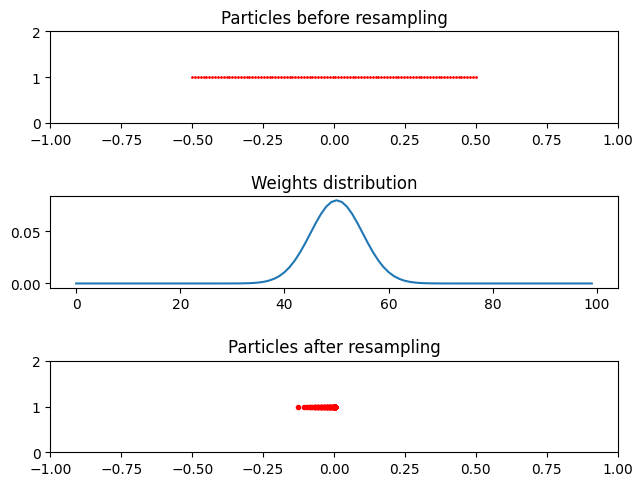

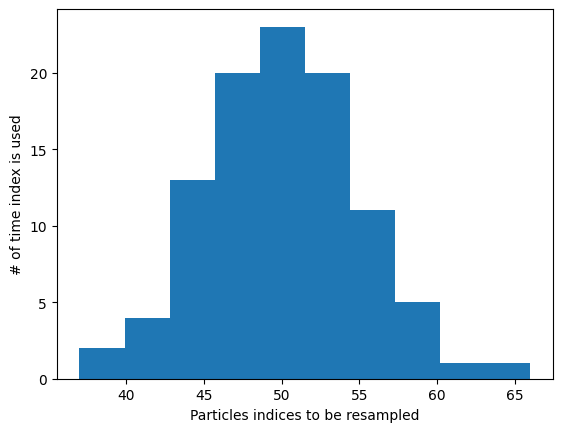

In [29]:
def gaussian(x, mu, sig):
    return np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))
N_PARTICLE = 100
particles = [Particle(N_LM) for i in range(N_PARTICLE)]
x_pos = []
w = []
for i in range(N_PARTICLE):
    particles[i].x = np.linspace(-0.5,0.5,N_PARTICLE)[i]
    x_pos.append(particles[i].x)
    particles[i].w = gaussian(i, N_PARTICLE/2, N_PARTICLE/20)
    w.append(particles[i].w)


# normalizzazione dei pesi
sw = sum(w)
for i in range(N_PARTICLE):
    w[i] /= sw

particles, new_indices = resampling(particles)
x_pos2 = []
for i in range(N_PARTICLE):
    x_pos2.append(particles[i].x)

# Plot results
fig, ((ax1,ax2,ax3)) = plt.subplots(nrows=3, ncols=1)
fig.tight_layout()
ax1.plot(x_pos,np.ones((N_PARTICLE,1)), '.r', markersize=2)
ax1.set_title("Particles before resampling")
ax1.axis((-1, 1, 0, 2))
ax2.plot(w)
ax2.set_title("Weights distribution")
ax3.plot(x_pos2,np.ones((N_PARTICLE,1)), '.r')
ax3.set_title("Particles after resampling")
ax3.axis((-1, 1, 0, 2))
fig.subplots_adjust(hspace=0.8)
plt.show()

plt.figure()
plt.hist(new_indices)
plt.xlabel("Particles indices to be resampled")
plt.ylabel("# of time index is used")
plt.show()

Definiamo il metodo fast_slam1 che prende in input:
 - il set di particelle, 
 - l'azione,
 - la misurazione
 
  ed implementa le tre fasi del filtro particellare, in particolare le fasi di:
  - predizione, 
  - correzione, 
  - ricampionamento,
  
   dando in output il nuovo set di particelle.

In [23]:
def fast_slam1(particles, u, z):
    particles = predict_particles(particles, u)

    particles = update_with_observation(particles, z)

    particles = resampling(particles)

    return particles

Definiamo i seguenti metodi e il metodo main per la simulazione.
- calc_final_state= calcola la posizione finale per ogni particella.
- calc_input= definisce l'azione in base al tempo.

Nel metodo main viene indicato il numero di landmark.
Se lo aumentiamo vediamo che la stima è più precisa. Noi lo abbiamo aumentato da 8 a 15.

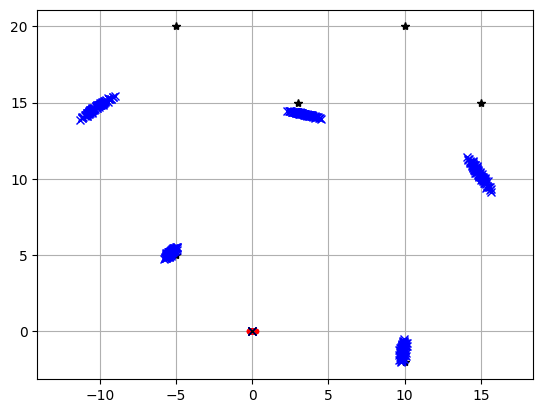

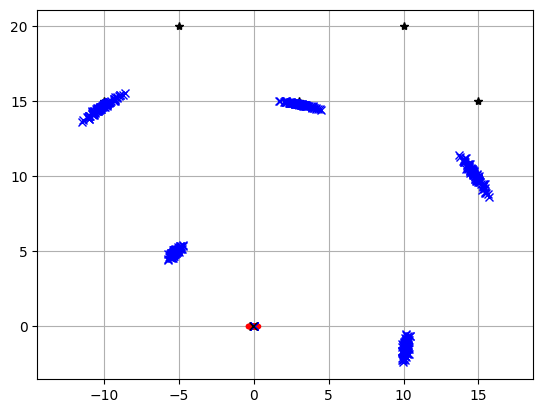

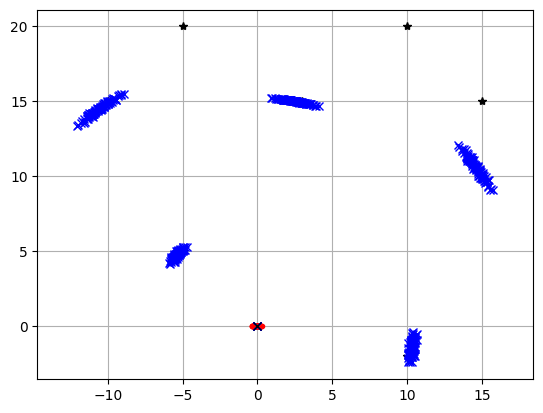

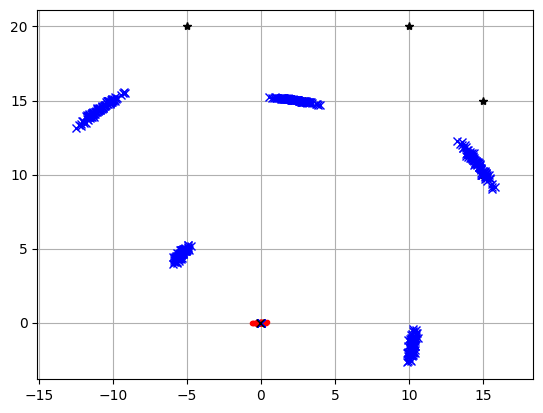

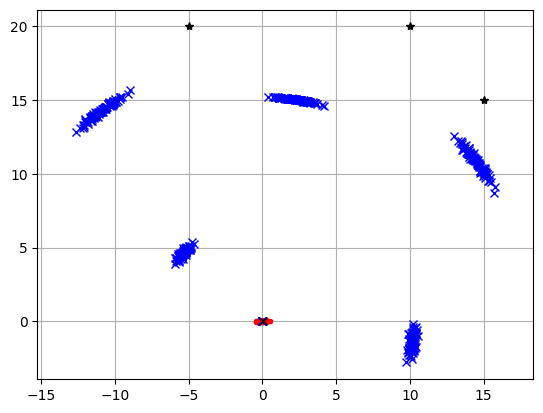

...

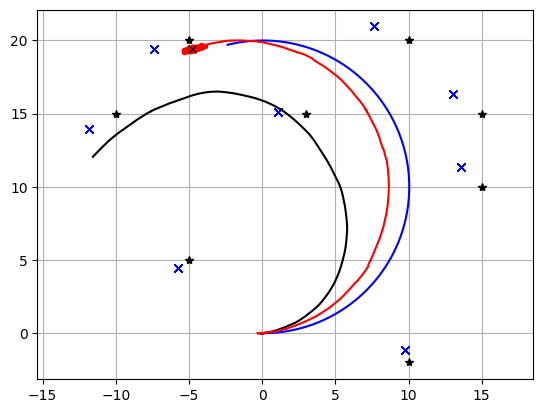

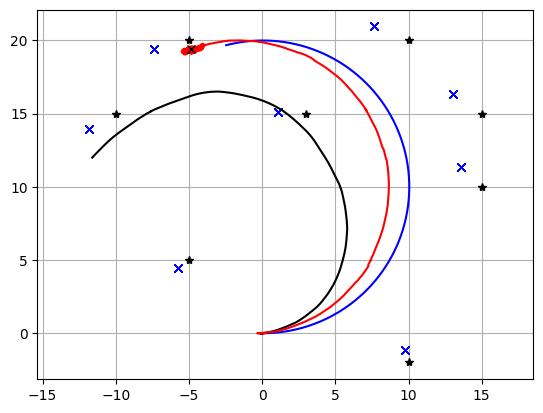

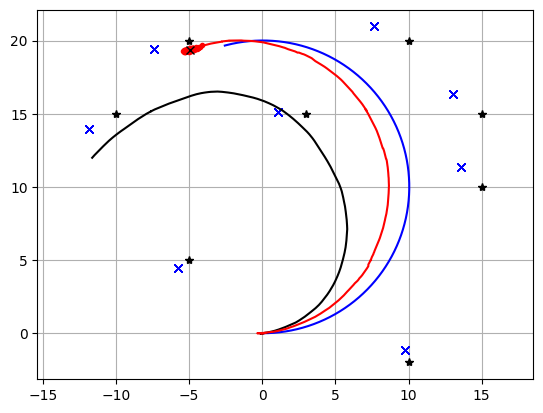

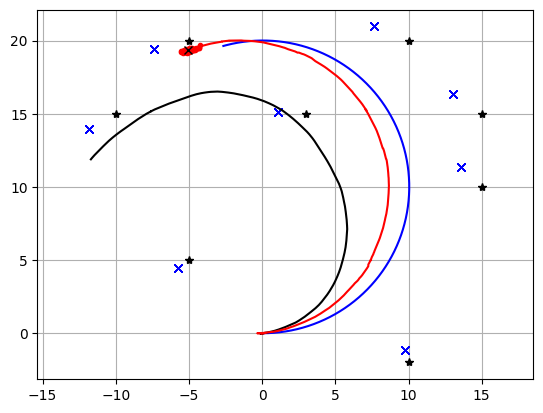

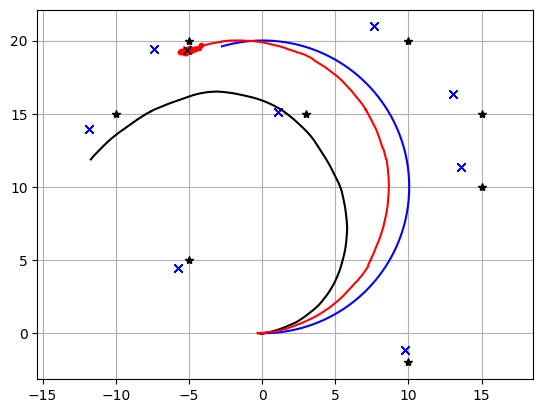

KeyboardInterrupt: 

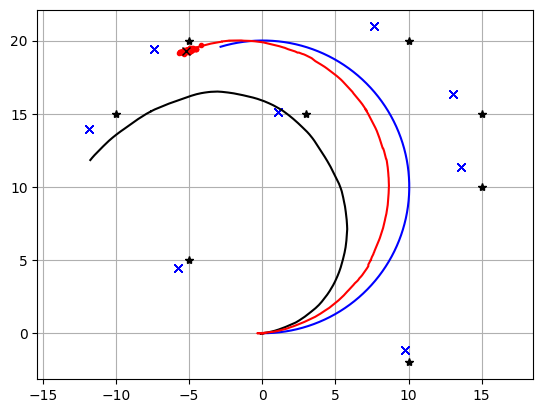

In [24]:
def calc_input(time):
    if time <= 3.0:  # wait at first
        v = 0.0
        yaw_rate = 0.0
    else:
        v = 1.0  # [m/s]
        yaw_rate = 0.1  # [rad/s]

    u = np.array([v, yaw_rate]).reshape(2, 1)

    return u

def calc_final_state(particles):
    xEst = np.zeros((STATE_SIZE, 1))

    particles = normalize_weight(particles)

    for i in range(N_PARTICLE):
        xEst[0, 0] += particles[i].w * particles[i].x
        xEst[1, 0] += particles[i].w * particles[i].y
        xEst[2, 0] += particles[i].w * particles[i].yaw

    xEst[2, 0] = pi_2_pi(xEst[2, 0])
    #  print(xEst)

    return xEst

def main():
   # print(__file__ + " start!!")

    time = 0.0

    # RFID positions [x, y]
    RFID = np.array([[10.0, -2.0],
                     [15.0, 10.0],
                     [15.0, 15.0],
                     [10.0, 20.0],
                     [3.0, 15.0],
                     [-5.0, 20.0],
                     [-5.0, 5.0],
                     [-10.0, 15.0]
                     ])
    n_landmark = 15 #RFID.shape[0] #ritorna il numero delle righe della matrice RFID, cioè 8.

    # State Vector [x y yaw v]'
    xEst = np.zeros((STATE_SIZE, 1))  # SLAM estimation
    xTrue = np.zeros((STATE_SIZE, 1))  # True state
    xDR = np.zeros((STATE_SIZE, 1))  # Dead reckoning

    # history
    hxEst = xEst
    hxTrue = xTrue
    hxDR = xTrue

    particles = [Particle(n_landmark) for _ in range(N_PARTICLE)]

    while SIM_TIME >= time:
        time += DT
        u = calc_input(time)

        xTrue, z, xDR, ud = observation(xTrue, xDR, u, RFID)

        particles = fast_slam1(particles, ud, z)

        xEst = calc_final_state(particles)

        x_state = xEst[0: STATE_SIZE]

        # store data history
        hxEst = np.hstack((hxEst, x_state))
        hxDR = np.hstack((hxDR, xDR))
        hxTrue = np.hstack((hxTrue, xTrue))

        if show_animation:  # pragma: no cover
            plt.cla()
            # for stopping simulation with the esc key.
            plt.gcf().canvas.mpl_connect(
                'key_release_event', lambda event:
                [exit(0) if event.key == 'escape' else None])
            plt.plot(RFID[:, 0], RFID[:, 1], "*k")

            for i in range(N_PARTICLE):
                plt.plot(particles[i].x, particles[i].y, ".r")
                plt.plot(particles[i].lm[:, 0], particles[i].lm[:, 1], "xb")

            plt.plot(hxTrue[0, :], hxTrue[1, :], "-b")
            plt.plot(hxDR[0, :], hxDR[1, :], "-k")
            plt.plot(hxEst[0, :], hxEst[1, :], "-r")
            plt.plot(xEst[0], xEst[1], "xk")
            plt.axis("equal")
            plt.grid(True)
            plt.pause(0.001)


if __name__ == '__main__':
    main()


Di seguito il codice completo

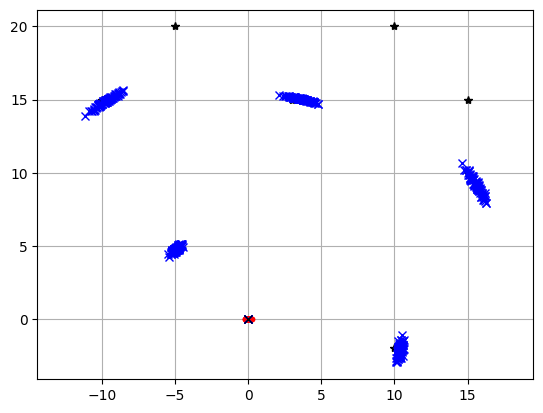

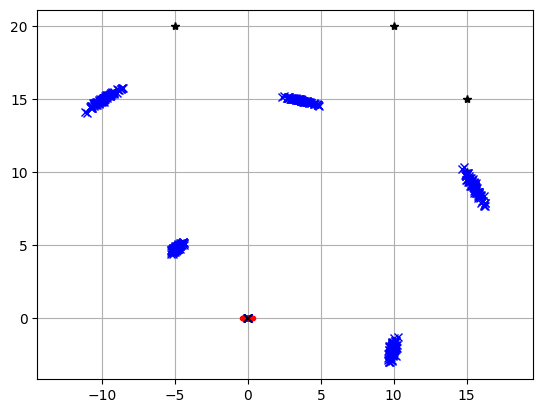

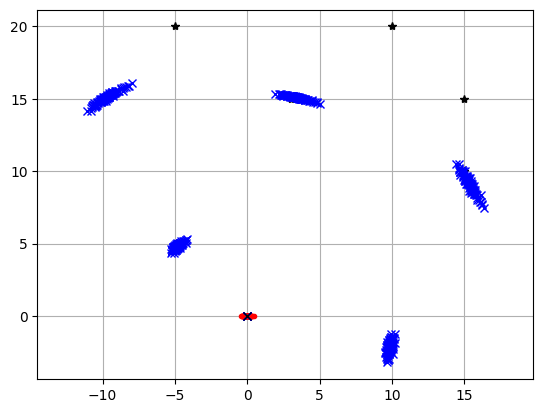

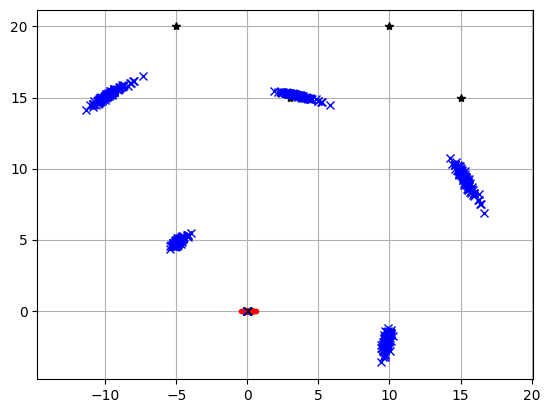

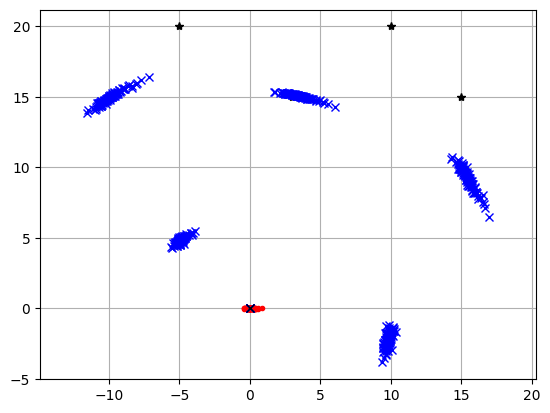

...

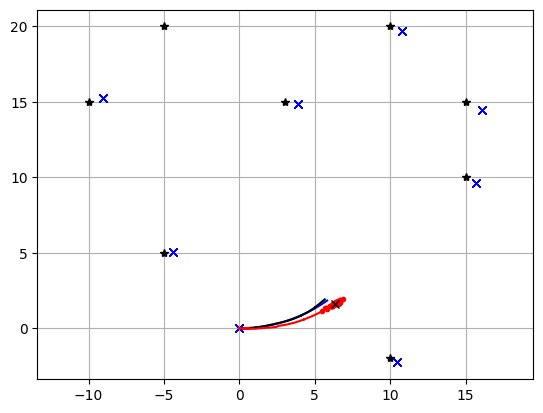

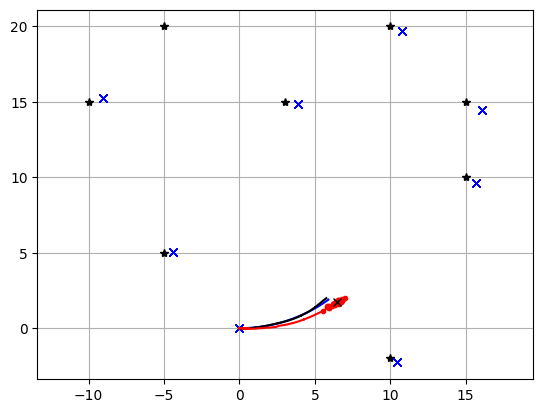

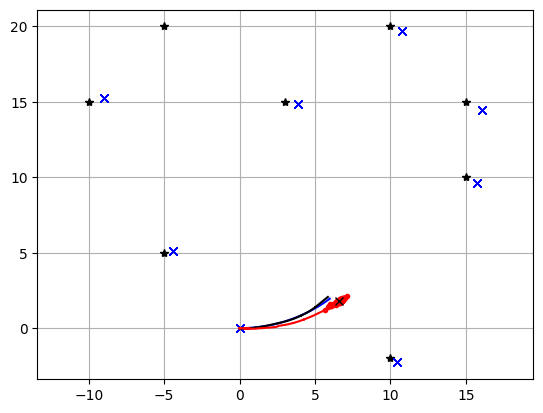

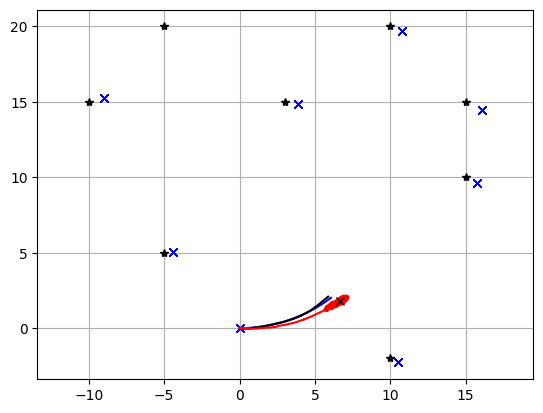

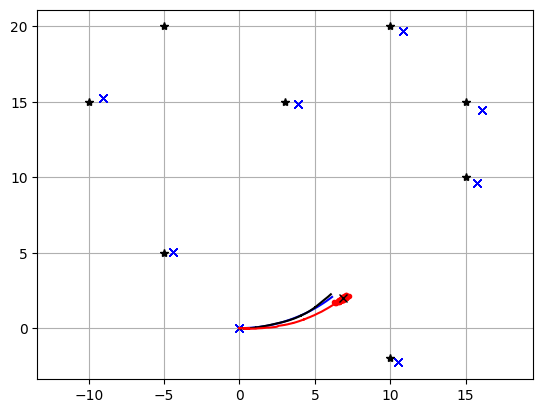

KeyboardInterrupt: 

In [ ]:
import math

import matplotlib.pyplot as plt
import numpy as np

# Fast SLAM covariance
Q = np.diag([3.0, np.deg2rad(10.0)]) ** 2
R = np.diag([1.0, np.deg2rad(20.0)]) ** 2

#  Simulation parameter
Q_sim = np.diag([0.3, np.deg2rad(2.0)]) ** 2
R_sim = np.diag([0.5, np.deg2rad(10.0)]) ** 2
OFFSET_YAW_RATE_NOISE = 0.01

DT = 0.1  # tempo [s]
SIM_TIME = 50.0  # simulazione tempo [s]
MAX_RANGE = 20.0  # massimo range di osservazione
M_DIST_TH = 2.0  # Soglia della distanza di Mahalanobis per l'associazione dei dati.
STATE_SIZE = 3  # Dimensione dello stato [x,y,yaw]
LM_SIZE = 2  # Dimensione della velocità LM [x,y]
N_PARTICLE = 100  # numero di particelle
NTH = N_PARTICLE / 1.5  # numero di particelle per il ricampionamento

show_animation = True


class Particle:

    def __init__(self, n_landmark):
        self.w = 1.0 / N_PARTICLE
        self.x = 0.0
        self.y = 0.0
        self.yaw = 0.0
        # landmark x-y positions
        self.lm = np.zeros((n_landmark, LM_SIZE))
        # landmark position covariance
        self.lmP = np.zeros((n_landmark * LM_SIZE, LM_SIZE))


def fast_slam1(particles, u, z):
    particles = predict_particles(particles, u)

    particles = update_with_observation(particles, z)

    particles = resampling(particles)

    return particles


def normalize_weight(particles):
    sum_w = sum([p.w for p in particles])

    try:
        for i in range(N_PARTICLE):
            particles[i].w /= sum_w
    except ZeroDivisionError:
        for i in range(N_PARTICLE):
            particles[i].w = 1.0 / N_PARTICLE

        return particles

    return particles


def calc_final_state(particles):
    xEst = np.zeros((STATE_SIZE, 1))

    particles = normalize_weight(particles)

    for i in range(N_PARTICLE):
        xEst[0, 0] += particles[i].w * particles[i].x
        xEst[1, 0] += particles[i].w * particles[i].y
        xEst[2, 0] += particles[i].w * particles[i].yaw

    xEst[2, 0] = pi_2_pi(xEst[2, 0])
    #  print(xEst)

    return xEst


def predict_particles(particles, u):
    for i in range(N_PARTICLE):
        px = np.zeros((STATE_SIZE, 1))
        px[0, 0] = particles[i].x
        px[1, 0] = particles[i].y
        px[2, 0] = particles[i].yaw
        ud = u + (np.random.randn(1, 2) @ R ** 0.5).T  # add noise
        px = motion_model(px, ud)
        particles[i].x = px[0, 0]
        particles[i].y = px[1, 0]
        particles[i].yaw = px[2, 0]

    return particles


def add_new_landmark(particle, z, Q_cov):
    r = z[0]
    b = z[1]
    lm_id = int(z[2])

    s = math.sin(pi_2_pi(particle.yaw + b))
    c = math.cos(pi_2_pi(particle.yaw + b))

    particle.lm[lm_id, 0] = particle.x + r * c
    particle.lm[lm_id, 1] = particle.y + r * s

    # covariance
    dx = r * c
    dy = r * s
    d2 = dx**2 + dy**2
    d = math.sqrt(d2)
    Gz = np.array([[dx / d, dy / d],
                   [-dy / d2, dx / d2]])
    particle.lmP[2 * lm_id:2 * lm_id + 2] = np.linalg.inv(
        Gz) @ Q_cov @ np.linalg.inv(Gz.T)

    return particle


def compute_jacobians(particle, xf, Pf, Q_cov):
    dx = xf[0, 0] - particle.x
    dy = xf[1, 0] - particle.y
    d2 = dx ** 2 + dy ** 2
    d = math.sqrt(d2)

    zp = np.array(
        [d, pi_2_pi(math.atan2(dy, dx) - particle.yaw)]).reshape(2, 1)

    Hv = np.array([[-dx / d, -dy / d, 0.0],
                   [dy / d2, -dx / d2, -1.0]])

    Hf = np.array([[dx / d, dy / d],
                   [-dy / d2, dx / d2]])

    Sf = Hf @ Pf @ Hf.T + Q_cov

    return zp, Hv, Hf, Sf


def update_kf_with_cholesky(xf, Pf, v, Q_cov, Hf):
    PHt = Pf @ Hf.T
    S = Hf @ PHt + Q_cov

    S = (S + S.T) * 0.5
    s_chol = np.linalg.cholesky(S).T
    s_chol_inv = np.linalg.inv(s_chol)
    W1 = PHt @ s_chol_inv
    W = W1 @ s_chol_inv.T

    x = xf + W @ v
    P = Pf - W1 @ W1.T

    return x, P


def update_landmark(particle, z, Q_cov):
    lm_id = int(z[2])
    xf = np.array(particle.lm[lm_id, :]).reshape(2, 1)
    Pf = np.array(particle.lmP[2 * lm_id:2 * lm_id + 2, :])

    zp, Hv, Hf, Sf = compute_jacobians(particle, xf, Pf, Q)

    dz = z[0:2].reshape(2, 1) - zp
    dz[1, 0] = pi_2_pi(dz[1, 0])

    xf, Pf = update_kf_with_cholesky(xf, Pf, dz, Q_cov, Hf)

    particle.lm[lm_id, :] = xf.T
    particle.lmP[2 * lm_id:2 * lm_id + 2, :] = Pf

    return particle


def compute_weight(particle, z, Q_cov):
    lm_id = int(z[2])
    xf = np.array(particle.lm[lm_id, :]).reshape(2, 1)
    Pf = np.array(particle.lmP[2 * lm_id:2 * lm_id + 2])
    zp, Hv, Hf, Sf = compute_jacobians(particle, xf, Pf, Q_cov)

    dx = z[0:2].reshape(2, 1) - zp
    dx[1, 0] = pi_2_pi(dx[1, 0])

    try:
        invS = np.linalg.inv(Sf)
    except np.linalg.linalg.LinAlgError:
        print("singular")
        return 1.0

    num = math.exp(-0.5 * dx.T @ invS @ dx)
    den = 2.0 * math.pi * math.sqrt(np.linalg.det(Sf))

    w = num / den

    return w


def update_with_observation(particles, z):
    for iz in range(len(z[0, :])):

        landmark_id = int(z[2, iz])

        for ip in range(N_PARTICLE):
            # new landmark
            if abs(particles[ip].lm[landmark_id, 0]) <= 0.01:
                particles[ip] = add_new_landmark(particles[ip], z[:, iz], Q)
            # known landmark
            else:
                w = compute_weight(particles[ip], z[:, iz], Q)
                particles[ip].w *= w
                particles[ip] = update_landmark(particles[ip], z[:, iz], Q)

    return particles


def resampling(particles):
    """
    low variance re-sampling
    """

    particles = normalize_weight(particles)

    pw = []
    for i in range(N_PARTICLE):
        pw.append(particles[i].w)

    pw = np.array(pw)

    n_eff = 1.0 / (pw @ pw.T)  # Effective particle number
    # print(n_eff)

    if n_eff < NTH:  # resampling
        w_cum = np.cumsum(pw)
        base = np.cumsum(pw * 0.0 + 1 / N_PARTICLE) - 1 / N_PARTICLE
        resample_id = base + np.random.rand(base.shape[0]) / N_PARTICLE

        inds = []
        ind = 0
        for ip in range(N_PARTICLE):
            while (ind < w_cum.shape[0] - 1) \
                    and (resample_id[ip] > w_cum[ind]):
                ind += 1
            inds.append(ind)

        tmp_particles = particles[:]
        for i in range(len(inds)):
            particles[i].x = tmp_particles[inds[i]].x
            particles[i].y = tmp_particles[inds[i]].y
            particles[i].yaw = tmp_particles[inds[i]].yaw
            particles[i].lm = tmp_particles[inds[i]].lm[:, :]
            particles[i].lmP = tmp_particles[inds[i]].lmP[:, :]
            particles[i].w = 1.0 / N_PARTICLE

    return particles


def calc_input(time):
    if time <= 3.0:  # wait at first
        v = 0.0
        yaw_rate = 0.0
    else:
        v = 1.0  # [m/s]
        yaw_rate = 0.1  # [rad/s]

    u = np.array([v, yaw_rate]).reshape(2, 1)

    return u


def observation(xTrue, xd, u, rfid):
    # calc true state
    xTrue = motion_model(xTrue, u)

    # add noise to range observation
    z = np.zeros((3, 0))
    for i in range(len(rfid[:, 0])):

        dx = rfid[i, 0] - xTrue[0, 0]
        dy = rfid[i, 1] - xTrue[1, 0]
        d = math.hypot(dx, dy)
        angle = pi_2_pi(math.atan2(dy, dx) - xTrue[2, 0])
        if d <= MAX_RANGE:
            dn = d + np.random.randn() * Q_sim[0, 0] ** 0.5  # add noise
            angle_with_noize = angle + np.random.randn() * Q_sim[
                1, 1] ** 0.5  # add noise
            zi = np.array([dn, pi_2_pi(angle_with_noize), i]).reshape(3, 1)
            z = np.hstack((z, zi))

    # add noise to input
    ud1 = u[0, 0] + np.random.randn() * R_sim[0, 0] ** 0.5
    ud2 = u[1, 0] + np.random.randn() * R_sim[
        1, 1] ** 0.5 + OFFSET_YAW_RATE_NOISE
    ud = np.array([ud1, ud2]).reshape(2, 1)

    xd = motion_model(xd, ud)

    return xTrue, z, xd, ud


def motion_model(x, u):
    F = np.array([[1.0, 0, 0],
                  [0, 1.0, 0],
                  [0, 0, 1.0]])

    B = np.array([[DT * math.cos(x[2, 0]), 0],
                  [DT * math.sin(x[2, 0]), 0],
                  [0.0, DT]])

    x = F @ x + B @ u

    x[2, 0] = pi_2_pi(x[2, 0])

    return x


def pi_2_pi(angle):
    return (angle + math.pi) % (2 * math.pi) - math.pi


def main():
    #print(__file__ + " start!!")

    time = 0.0

    # RFID positions [x, y]
    RFID = np.array([[10.0, -2.0],
                     [15.0, 10.0],
                     [15.0, 15.0],
                     [10.0, 20.0],
                     [3.0, 15.0],
                     [-5.0, 20.0],
                     [-5.0, 5.0],
                     [-10.0, 15.0]
                     ])
    n_landmark = RFID.shape[0]

    # State Vector [x y yaw v]'
    xEst = np.zeros((STATE_SIZE, 1))  # SLAM estimation
    xTrue = np.zeros((STATE_SIZE, 1))  # True state
    xDR = np.zeros((STATE_SIZE, 1))  # Dead reckoning

    # history
    hxEst = xEst
    hxTrue = xTrue
    hxDR = xTrue

    particles = [Particle(n_landmark) for _ in range(N_PARTICLE)]

    while SIM_TIME >= time:
        time += DT
        u = calc_input(time)

        xTrue, z, xDR, ud = observation(xTrue, xDR, u, RFID)

        particles = fast_slam1(particles, ud, z)

        xEst = calc_final_state(particles)

        x_state = xEst[0: STATE_SIZE]

        # store data history
        hxEst = np.hstack((hxEst, x_state))
        hxDR = np.hstack((hxDR, xDR))
        hxTrue = np.hstack((hxTrue, xTrue))

        if show_animation:  # pragma: no cover
            plt.cla()
            # for stopping simulation with the esc key.
            plt.gcf().canvas.mpl_connect(
                'key_release_event', lambda event:
                [exit(0) if event.key == 'escape' else None])
            plt.plot(RFID[:, 0], RFID[:, 1], "*k")

            for i in range(N_PARTICLE):
                plt.plot(particles[i].x, particles[i].y, ".r")
                plt.plot(particles[i].lm[:, 0], particles[i].lm[:, 1], "xb")

            plt.plot(hxTrue[0, :], hxTrue[1, :], "-b")
            plt.plot(hxDR[0, :], hxDR[1, :], "-k")
            plt.plot(hxEst[0, :], hxEst[1, :], "-r")
            plt.plot(xEst[0], xEst[1], "xk")
            plt.axis("equal")
            plt.grid(True)
            plt.pause(0.001)


if __name__ == '__main__':
    main()
